## In this report you'll find:
<ul>
    <li>My gaussian noise function
    <li>Convolved with my convolve2d
    <li>Mean sqaured error caclculation including histograms
    <li>Custom Rotate function
    <li>Image encryption & decryption
    <li>Basic augmentations on Image
        </ul>
    

In [ ]:
from matplotlib import pyplot as plt
import cv2
import numpy as np
import scipy.ndimage
import random

In [2]:
def normalizing(img):
    return np.array((img - np.min(img)) / (np.max(img) - np.min(img)))

In [3]:
def add_gaussian(img, mean, standart_deviation):
    noisy_image = np.zeros(img.shape, np.float32)
    if len(img.shape) == 2:
        gaussian = np.random.normal(mean, standart_deviation,(img.shape[0], img.shape[1]))
    else:
        gaussian = np.random.normal(mean, standart_deviation,(img.shape[0], img.shape[1],img.shape[2]))
    noisy_image = img + gaussian
    noisy_image = normalizing(noisy_image)
    return noisy_image

In [4]:
img = cv2.imread('messi.jpg')
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [5]:
mean = 0
standart_deviation = 10

Text(0.5, 1.0, 'real')

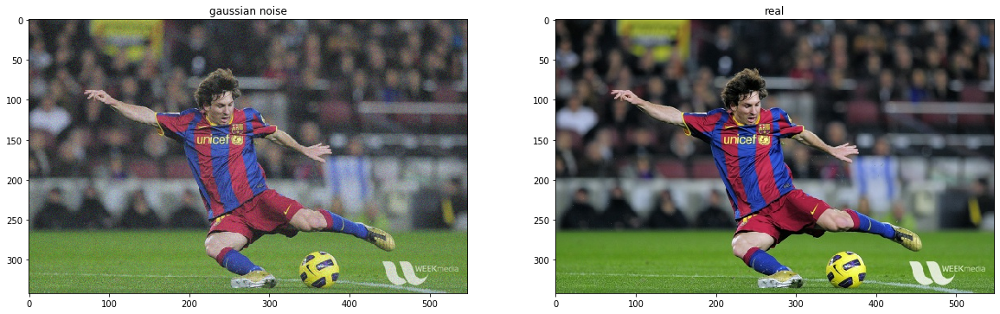

In [6]:
rgb_gaussian = add_gaussian(img_rgb, mean, standart_deviation)

plt.figure(figsize=[20,10])
plt.subplot(121)
plt.imshow(rgb_gaussian)
plt.title('gaussian noise')
plt.subplot(122)
plt.imshow(img_rgb)
plt.title('real')



Text(0.5, 1.0, 'real')

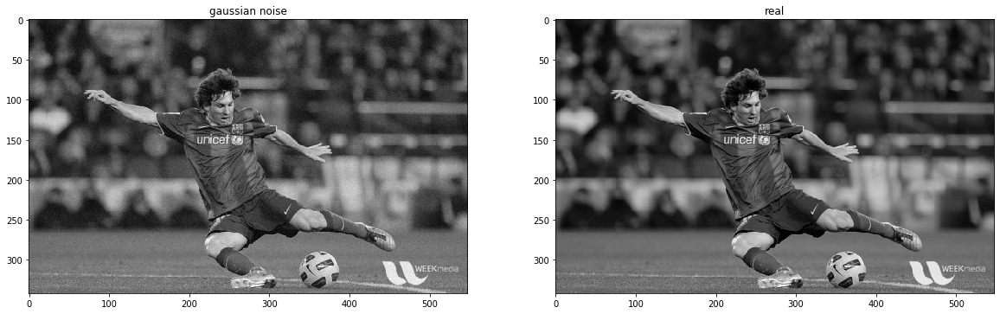

In [7]:
gray_gaussian = add_gaussian(img_gray, mean, standart_deviation)

plt.figure(figsize=[20,10])
plt.subplot(121)
plt.imshow(gray_gaussian, cmap = 'gray')
plt.title ('gaussian noise')
plt.subplot(122)
plt.imshow(img_gray, cmap = 'gray')
plt.title('real')


# Filter with convolution from report2:

In [8]:
def convolve2d(image, kernel):
    kernel = np.flip(np.flip(kernel, axis = 1), axis = 0)
    convolved_matrix = np.zeros_like(image)
    mask_size = kernel.shape[0]
    image = normalizing(image)
    padding_size = int((mask_size - 1)/2)
    image_cpy = np.zeros([2*padding_size + image.shape[0], 2*padding_size + image.shape[1]]) #a copy of the image to work on (used for padding)
    image_cpy[padding_size:-padding_size, padding_size: -padding_size] = image
    
    for x in range(image.shape[1]):
            for y in range(image.shape[0]):
                convolved_matrix[y, x] = (kernel * image_cpy[y:y + mask_size, x:x + mask_size]).sum()
    return convolved_matrix
    
    
    
    

In [9]:
kernel_size = 3

In [10]:
def filter_image(image):
    
    kernel = np.ones((kernel_size,kernel_size),np.float32)/(kernel_size**2)
    return convolve2d(image, kernel)

Text(0.5, 1.0, 'filterred')

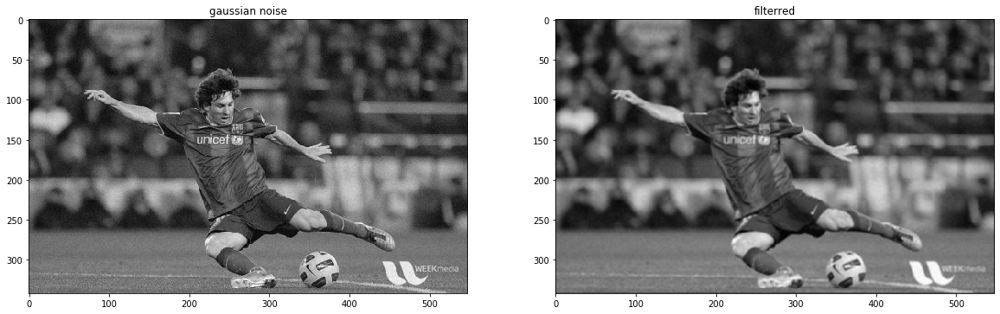

In [11]:
image_filtered = filter_image(gray_gaussian)
plt.figure(figsize=[20,10])
plt.subplot(121)
plt.imshow(gray_gaussian, cmap = 'gray')
plt.title ('gaussian noise')
plt.subplot(122)
plt.imshow(image_filtered, cmap = 'gray')
plt.title('filterred')

# Absolute values:

In [12]:
def absolute_difference(image1, image2):
    return abs(image1 - image2)

Text(0.5, 1.0, 'filterred')

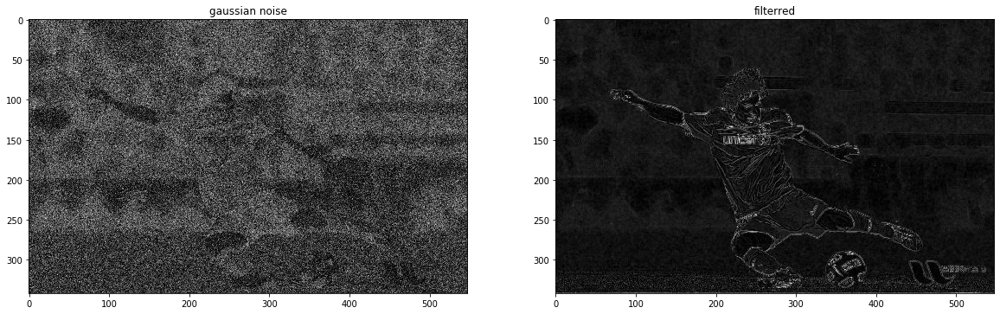

In [13]:
abs_gauss = absolute_difference(gray_gaussian, normalizing(img_gray))
abs_filter = absolute_difference (image_filtered, normalizing(img_gray))
plt.figure(figsize=[20,10])
plt.subplot(121)
plt.imshow(abs_gauss, cmap = 'gray')
plt.title ('gaussian noise')
plt.subplot(122)
plt.imshow(abs_filter, cmap = 'gray')
plt.title('filterred')

# MSE:

In [14]:
def mse(original_image, manipulated_image):
    mean_squared = np.mean(pow(absolute_difference(original_image, manipulated_image),2))
    return mean_squared

In [15]:
gauss_mse = mse(normalizing(img_gray), gray_gaussian)
filterred_mse =  mse(normalizing(img_gray), image_filtered)

print (gauss_mse)
print (filterred_mse)

0.0013800377158698109
0.001994039916093022


# histograms:

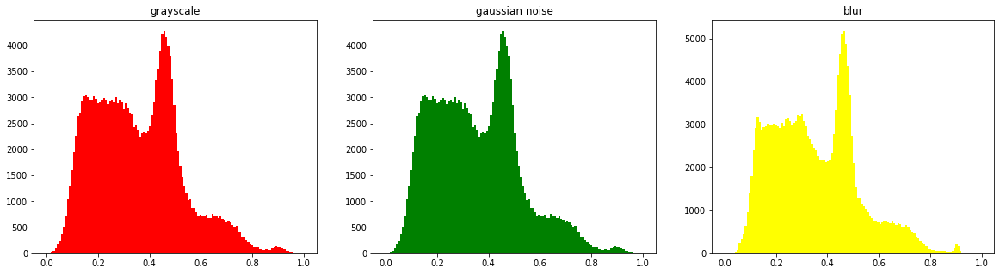

In [16]:
def plot_histograms():
    plt.figure(figsize=[20,5])
    plt.subplot(131)
    plt.hist(normalizing(gray_gaussian.flatten()), 128, [0,1], histtype='stepfilled', color = 'red')
    plt.title('grayscale')
    plt.subplot(132)
    plt.hist(gray_gaussian.flatten(), 128, [0,1], histtype='stepfilled', color = 'green')
    plt.title('gaussian noise')
    plt.subplot(133)
    plt.hist(image_filtered.flatten(), 128, [0,1], histtype='stepfilled', color = 'yellow')
    plt.title('blur')
    
plot_histograms()

# Rotate:

In [17]:
from math import pi, sin, cos

def rotate(img, angle):
    rotated_image = np.zeros_like(img)
    center_y = img.shape[0]/2
    center_x = img.shape[1]/2
    angle = angle*pi/180
    
    # in case of grayscale image:
    if len(rotated_image.shape) <= 2: 
        for x in range(img.shape[1]):
            for y in range(img.shape[0]):
                xp = int((x - center_x) * cos(angle) - (y - center_y) * sin(angle) + center_x)
                yp = int((x - center_x) * sin(angle) + (y - center_y) * cos(angle) + center_y)        
                if 0 <= xp < img.shape[1] and 0 <= yp < img.shape[0]:
                    rotated_image[y,x] = img [yp,xp]
    #in case of colored image:                
    else: 
        for channel in range (img.shape[2]): 
            for x in range(img.shape[1]):
                for y in range(img.shape[0]):
                    xp = int((x - center_x) * cos(angle) - (y - center_y) * sin(angle) + center_x)
                    yp = int((x - center_x) * sin(angle) + (y - center_y) * cos(angle) + center_y)
        
                    if 0 <= xp < img.shape[1] and 0 <= yp < img.shape[0]:
                        rotated_image[y,x,channel] = img [yp,xp,channel]
        
    return rotated_image
            

    


Text(0.5, 1.0, 'RGB rotated')

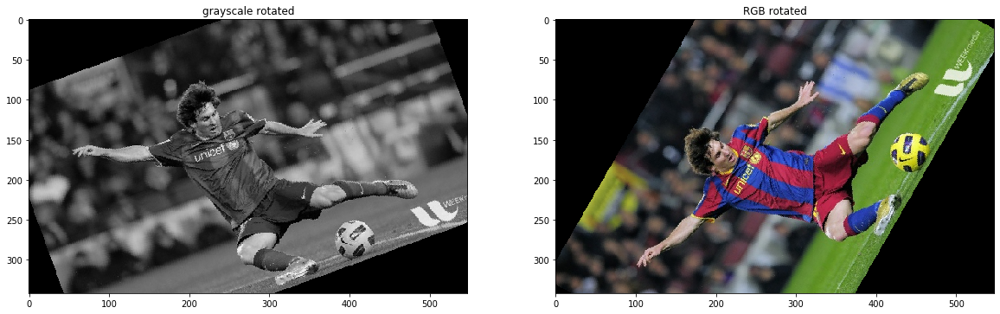

In [18]:
plt.figure(figsize=[20,10])
rotated_img = rotate(img_gray, 20)
plt.subplot(121)
plt.imshow(rotated_img, cmap = 'gray')
plt.title('grayscale rotated')
rgb_rotated = rotate(img_rgb, 60)
plt.subplot(122)
plt.imshow(rgb_rotated)
plt.title('RGB rotated')

# Image encryption & decryption:

In [19]:
path_lenna = 'Lenna.png'
lenna_img = cv2.imread(path_lenna)
lenna_rgb = cv2.cvtColor(lenna_img, cv2.COLOR_BGR2RGB)


In [20]:
messi_rgb_resize = cv2.resize(img_rgb, (600,600))
lenna_rgb_resize = cv2.resize(lenna_rgb, (200,200))

def encrypt(img1, img2):
     for i in range(img2.shape[0]): 
        for j in range(img2.shape[1]): 
            for channel in range(img.shape[2]): 
                  
                v1 = format(img1[i][j][channel], '08b') 
                v2 = format(img2[i][j][channel], '08b') 
                  
                # Taking 4 MSBs of each image 
                v3 = v1[:4] + v2[:4]  
                  
                img1[i][j][channel]= int(v3, 2)
                
     return img1              

  
      
def decrypt(img): 
    width = img.shape[0]
    height = img.shape[1]
    img2 = np.zeros((200,200, 3), np.uint8)
    discover_image = np.zeros((width, height, 3), np.uint8)
      
    for i in range(width): 
        for j in range(height): 
            for channel in range(img.shape[2]): 
                v1 = format(img[i][j][channel], '08b') 
                v2 = v1[:4] + chr(np.random.randint(0, 1)+48) * 4
                v3 = v1[4:] + chr(np.random.randint(0, 1)+48) * 4
                
                discover_image [i][j][channel]= int(v3, 2)
                if i<lenna_rgb_resize.shape[0] and j <lenna_rgb_resize.shape[1]: 
                    img2[i][j][channel]= int(v3, 2) 
    return img2, discover_image

      
      
messi_crypto = encrypt(messi_rgb_resize, lenna_rgb_resize) 
lenna_dec, discovered = decrypt(messi_crypto) 



# Images after manipulation:

Text(0.5, 1.0, 'hidden image')

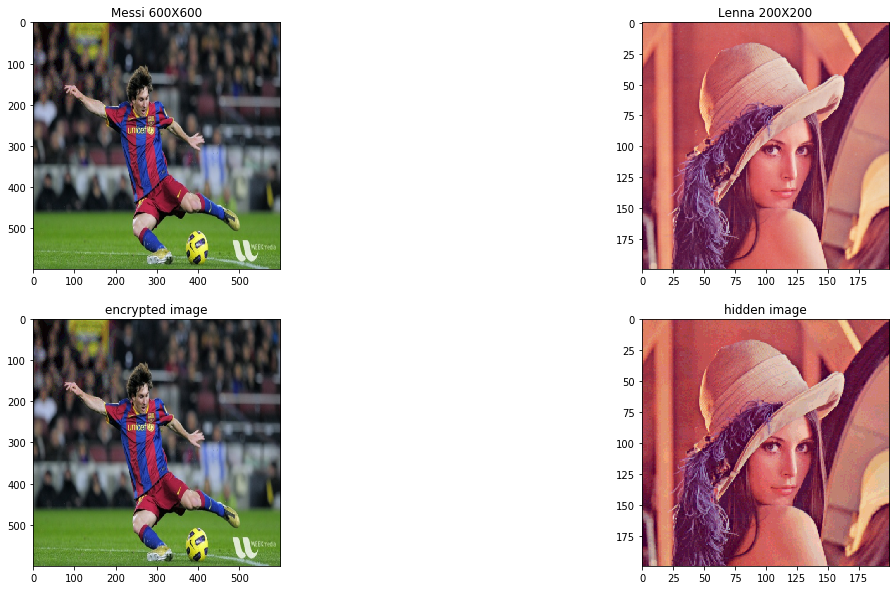

In [21]:
plt.figure(figsize=[20,10])
plt.subplot(221)
plt.imshow(messi_rgb_resize)
plt.title('Messi 600X600')
plt.subplot(222)
plt.imshow(lenna_rgb_resize)
plt.title('Lenna 200X200')


plt.subplot(223)
plt.imshow(messi_crypto)
plt.title('encrypted image')
plt.subplot(224)
plt.imshow(lenna_dec)
plt.title('hidden image')



Text(0.5, 1.0, 'extracted image')

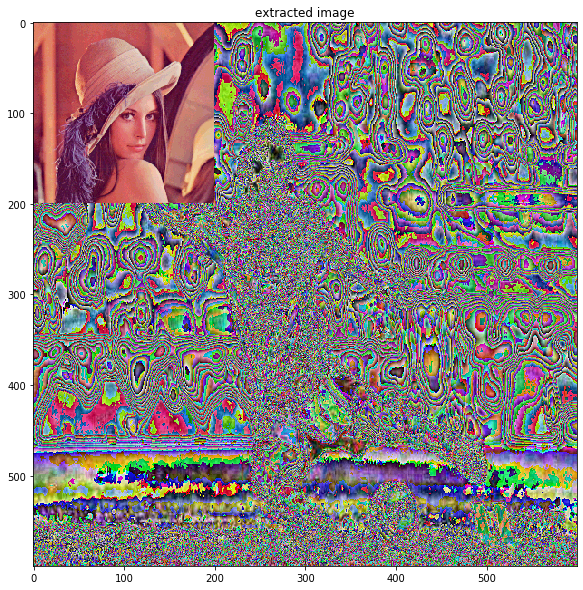

In [22]:
plt.figure(figsize=[20,10])
plt.imshow(discovered)
plt.title('extracted image')

In [23]:
class Manipulate(object):
    def flip(self, img):
        return cv2.flip(img, 1)
    
    
    def rotate(self, pic, angle):
        centerH,centerW = pic.shape[0]//2,pic.shape[1]//2
        rotation_matrix = cv2.getRotationMatrix2D((centerW, centerH), angle, 1)
        return abs(cv2.warpAffine(pic, rotation_matrix, (pic.shape[1],pic.shape[0])))
    
    def GaussianBlur(self, image, kernel_size):
        return cv2.GaussianBlur(image, (kernel_size, kernel_size),0)
    
    def medianBlur(self, image, kernel_size):
        return cv2.medianBlur(image, kernel_size)
    
    def zoom(self, image, zoom_factor):
        height, width = image.shape[0:2]
        new_width = int(zoom_factor*width)//2
        new_height = int(zoom_factor*height)//2
        cropped = self.crop(image, new_height,-new_height, new_width, -new_width)
        return cv2.resize(cropped, (width, height), interpolation = cv2.INTER_AREA)
    
    def crop(self, image, fromRow, toRow, fromCol, toCol):
        return image[fromRow:toRow, fromCol:toCol]
    


    

In [32]:
class GenerateManipulation(Manipulate):
    
    def __init__(self, image, N, M):
        self.image = image
        self.N = N
        self.M = M
        self.methods = [ m for m in dir(Manipulate) if not m.startswith('__')]
        
    def select_n_augmentations(self, image):
        selected = np.random.choice(self.methods, self.N, replace=True, p=self.M)
        manipulated = []
        for i in range(self.N):
            manipulated.append(self.call_function(selected[i]))
               
        self.display_images(manipulated, selected)

    def call_function(self, method):
        cords_for_crop = self.gen_numbers(self.image)
        functions = {
            'flip': self.flip(self.image),
            'rotate': self.rotate(self.image, random.randint(1,360)),
            'GaussianBlur': self.GaussianBlur(self.image, random.randrange(1,15,2)),
            'medianBlur':self.medianBlur(self.image, random.randrange(1,15,2)),
            'zoom': self.zoom(self.image, random.uniform(0, 1)),
            'crop': self.crop(self.image, cords_for_crop[0], cords_for_crop[1], cords_for_crop[2], cords_for_crop[3])
        }
        return functions.get(method)
        
        
    def gen_numbers(self, image):
        fromRow = random.randint(0,self.image.shape[0] - 2)
        toRow = random.randint(fromRow, self.image.shape[0] -1)
        fromCol = random.randint(0,self.image.shape[1] - 2)
        toCol = random.randint(fromCol, self.image.shape[1] -1)
        return (fromRow, toRow, fromCol, toCol)
    
    
    
    def display_images(self, images, functions):
        fig = plt.figure(figsize=[80,80])
        cols = 5
        rows = self.N//cols+1
        for i in range(self.N):
            plt.subplot(rows, cols, i+1)
#             fig.add_subplot(rows, cols, i+1)
            plt.imshow(images[i])
            plt.title(functions[i], y=1.01)
        plt.tight_layout()

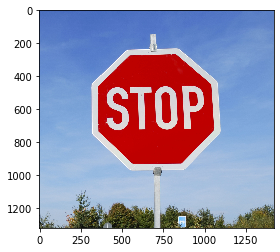

In [25]:
stop_img = plt.imread('stopsign.jpg')
plt.imshow(stop_img)
plt.show()

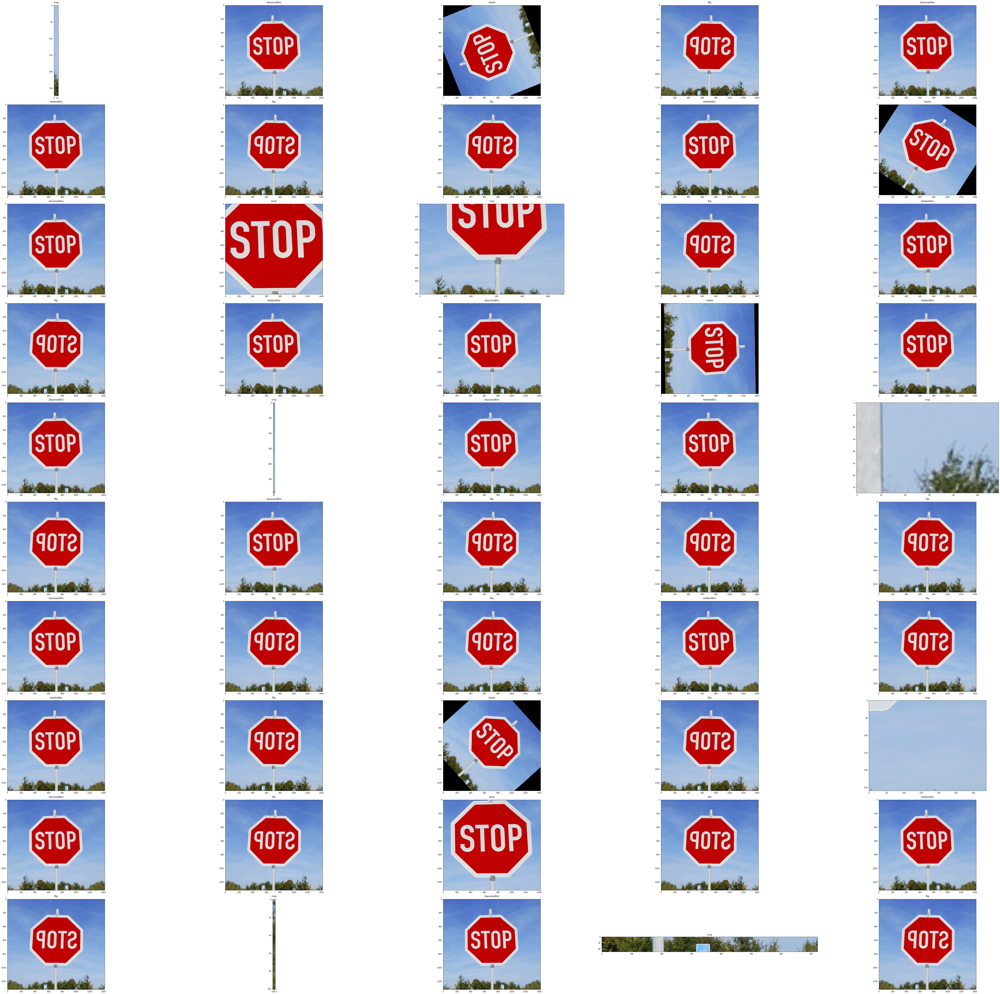

In [33]:
gm2 = GenerateManipulation(stop_img, 50, [0.2,0.2,0.2,0.2,0.1,0.1])
gm2.select_n_augmentations(stop_img)